## Import library

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd '/content/drive/MyDrive/ML_Project'

/content/drive/MyDrive/ML_Project


In [ ]:
#!pip install librosa
import os
import glob
import random
import torch
import scipy.stats
import numpy as np
import pandas as pd
import librosa as ls
import seaborn as sns
import soundfile as sf
from IPython.display import Audio
import matplotlib
matplotlib.use('Agg')

from utils.utils import (sample_one_file_per_genre, plot_waveform_grid,
                         plot_spectrogram_grid, plot_mel_grid,
                         plot_chroma_grid, visualize_genre_dashboard,
                         visualize_consecutive_crops, extract_features,
                         visualize_noise_effect_consecutive)

from utils.model_evaluation_utils import (compare_models, load_models,
                                          plot_model_comparison,
                                          evaluate_song_level_accuracy)


from sklearn.model_selection import (train_test_split, GroupShuffleSplit,
                                      StratifiedGroupKFold)


from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score, classification_report
from train_cnn import train_image
from train_mlp import train_feature, test_feature


from collections import Counter
import matplotlib.pyplot as plt
from warnings import filterwarnings
filterwarnings('ignore')

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [ ]:
DATA_PATH = 'Data/genres_original'

total classes: 10


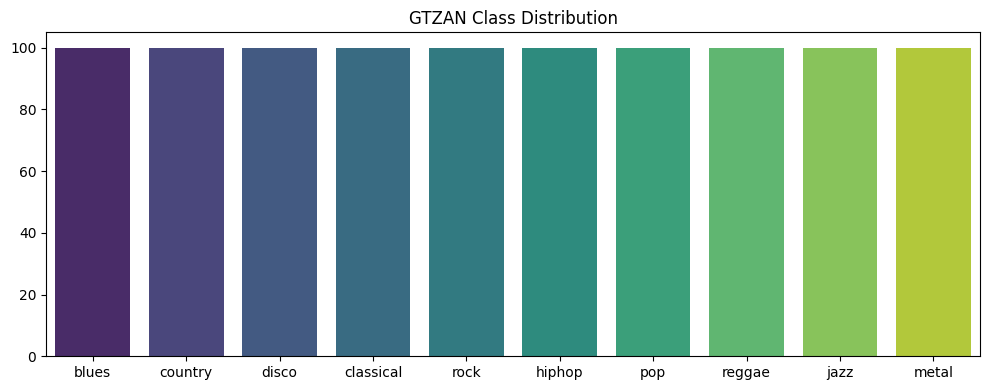

In [ ]:
%matplotlib inline

import seaborn as sns
import matplotlib.pyplot as plt
import glob, os

DATA_PATH = "Data/genres_original"

classes_files = glob.glob(DATA_PATH + "/*")
print(f'total classes: {len(classes_files)}')

stats = {}
for cls in classes_files:
    files = glob.glob(cls + '/*.wav')
    if len(files) > 0:
        name_cls = os.path.basename(cls)
        stats[name_cls] = len(files)

plt.figure(figsize=(10,4))
sns.barplot(x=list(stats.keys()), y=list(stats.values()), palette="viridis")
plt.title("GTZAN Class Distribution")
plt.tight_layout()
plt.show()


| Thư viện         | Mục tiêu      | Đặc điểm                            |
| ---------------- | ------------- | ----------------------------------- |
| `soundfile.read` | I/O chính xác | đọc raw PCM, không resample         |
| `librosa.load`   | ML pipeline   | có cache, mono mix, resample tối ưu |


In [ ]:
# sampling_rates = []
# channels = []
# subtypes = []

# for path in glob.glob(DATA_PATH + '/*/*'):
#   info = sf.info(path)
#   sampling_rates.append(info.samplerate)
#   channels.append(info.channels)
#   subtypes.append(info.subtype)


# print("Sampling rates:", Counter(sampling_rates))
# print("Channels:", Counter(channels))
# print("Subtypes:", Counter(subtypes))

In [ ]:
%matplotlib inline

## Data Augumentation

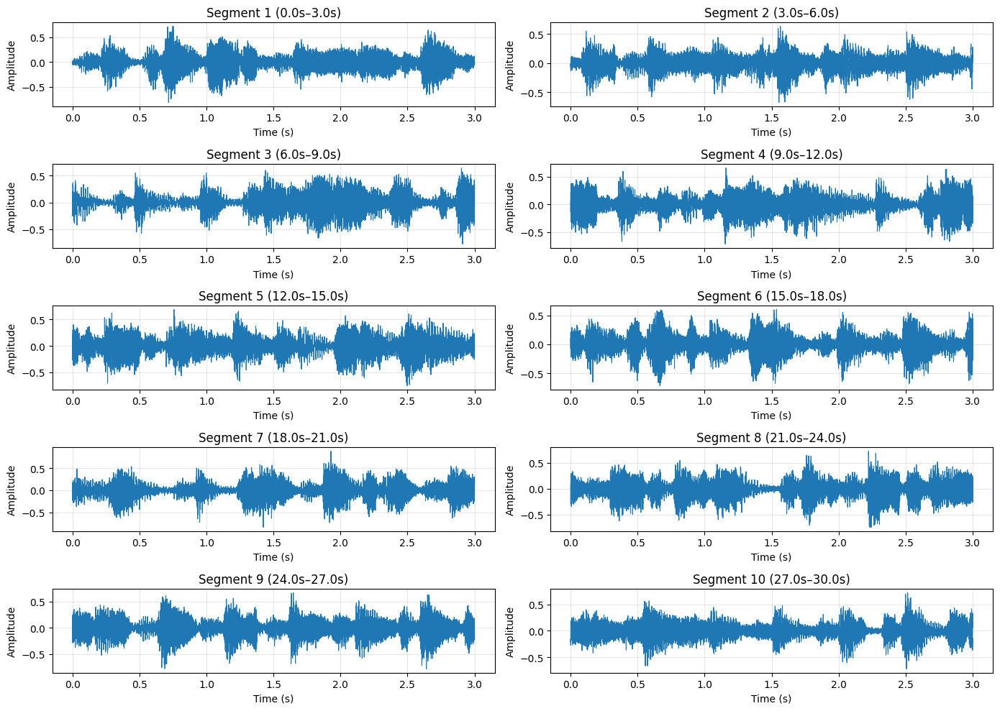

In [ ]:
%matplotlib inline
visualize_consecutive_crops(f'{DATA_PATH}/blues/blues.00000.wav')

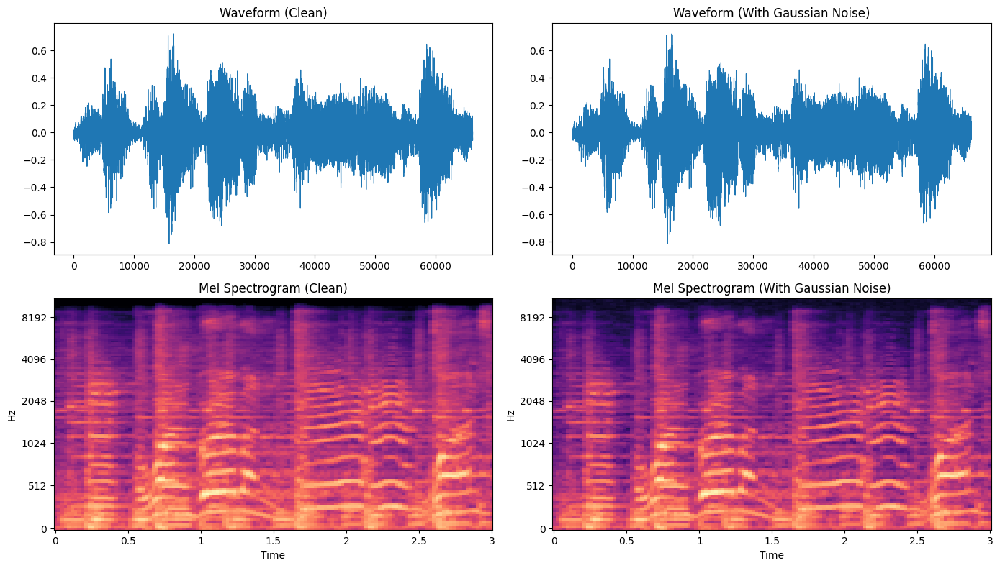

In [ ]:
%matplotlib inline
visualize_noise_effect_consecutive(f'{DATA_PATH}/blues/blues.00000.wav')

## EDA single file wav



- **y**: mảng `float32`, biên độ chuẩn hóa  
- **sr**: sampling rate từ header WAV  
- **y[n]** ≈ áp suất âm tại thời điểm  $$t = \frac{n}{sr} $$


$$
y[n] \approx \frac{p(nT_s)}{p_{\max}}, \qquad T_s = \frac{1}{sr}
$$


Loading one samples

In [ ]:
# reading 1 sample
y, sr = ls.load(f'{DATA_PATH}/blues/blues.00000.wav', sr=None, mono = True)

In [ ]:
import IPython.display as ipd
ipd.Audio(f'{DATA_PATH}/blues/blues.00000.wav')

Check duration

In [ ]:
N = len(y)
duration = N / sr
print("Samples:", N)
print("Duration (s):", duration)

Samples: 661794
Duration (s): 30.013333333333332


Ranges of amplitude y

In [ ]:
y_min = np.min(y)
y_max = np.max(y)
y_mean = np.mean(y)
y_min, y_max, y_mean

(np.float32(-0.8402405), np.float32(0.885376), np.float32(-5.968482e-05))

The signal mean is close to zero, indicating no significant DC offset.

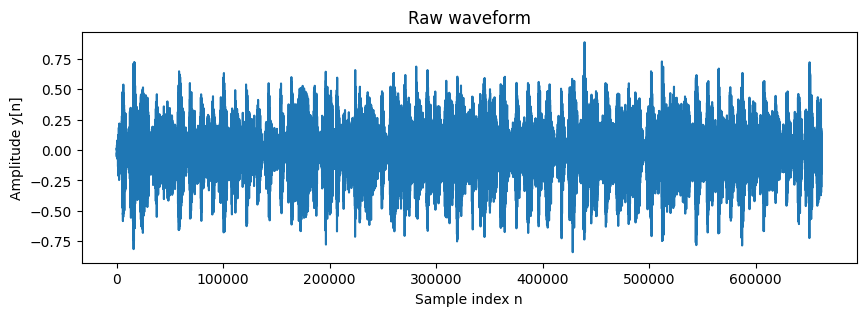

In [ ]:
plt.figure(figsize=(10, 3))
plt.plot(y)
plt.title("Raw waveform")
plt.xlabel("Sample index n")
plt.ylabel("Amplitude y[n]")
plt.show()

Visualize mel spectrogram

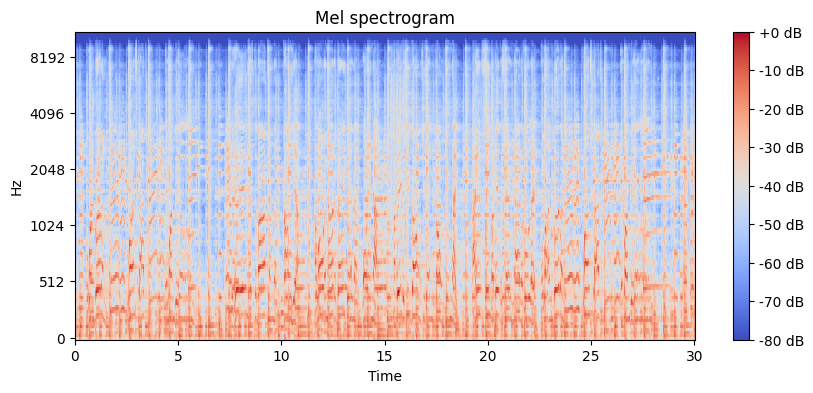

In [ ]:
fig, ax = plt.subplots(figsize=(10, 4))

M = ls.feature.melspectrogram(y=y, sr=sr, n_mels=128)
M_db = ls.power_to_db(M, ref=np.max)

img = ls.display.specshow(
    M_db, sr=sr, x_axis='time', y_axis='mel', ax=ax, cmap='coolwarm'
)
plt.colorbar(img, ax=ax, format='%+2.0f dB')
plt.title("Mel spectrogram")
plt.show()

RMS (Root Mean Square)

$$
\mathrm{RMS} = \sqrt{\frac{1}{N} \sum_{n=1}^{N} y[n]^2}
$$

- Đại diện cho **energy / loudness**
- Tai người cảm nhận gần **RMS (log-scale)**


In [ ]:
rms = ls.feature.rms(y=y)[0]  # per-frame RMS
print("RMS mean:", np.mean(rms))
print("RMS std:", np.std(rms))

RMS mean: 0.13018432
RMS std: 0.053182516


0.13:  âm lượng trung bình, không bị clip, không quá nhỏ

RMS std ≈ 0.053 (RMS std	Ý nghĩa
< 0.02	rất đều (ambient / sustained)
0.03 – 0.06	dynamic tự nhiên)

ZCR (Zero Crossing Rate)

**ZCR ≠ số mẫu**  
**ZCR = số lần tín hiệu đổi dấu**

$$
\mathrm{ZCR} = \frac{1}{N-1} \sum_{n=1}^{N-1} \mathbf{1}
\big( y[n] \cdot y[n+1] < 0 \big)
$$

Đếm **số lần tín hiệu đi qua mức 0** (sign change)

Ý nghĩa vật lý / tín hiệu

| ZCR | Ý nghĩa |
|----:|--------|
| Thấp | Voiced / harmonic (speech, vowel, bass, tone) |
| Cao  | Noise / fricative / percussive (s, sh, hi-hat, snare) |


In [ ]:
zcr = ls.feature.zero_crossing_rate(y)[0]
zcr_mean = np.mean(zcr)
zcr_std = np.std(zcr)
print("ZCR mean:", zcr_mean)
print("ZCR std:", zcr_std)

ZCR mean: 0.08304482066898686
ZCR std: 0.027693783681433826


16


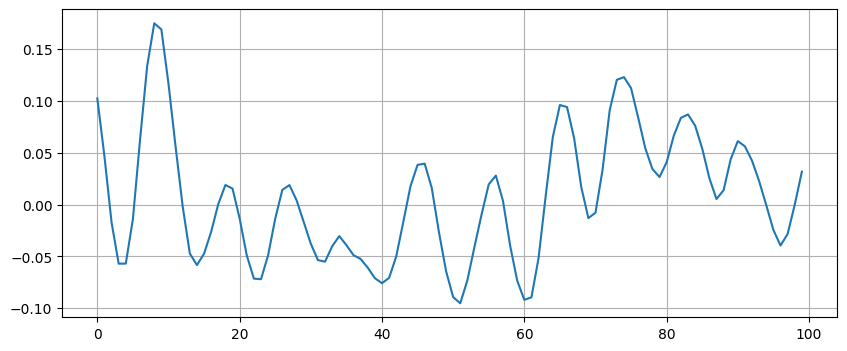

In [ ]:
# Zooming in
%matplotlib inline
n0 = 9000
n1 = 9100
plt.figure(figsize=(10, 4))
plt.plot(y[n0:n1])

zero_crossings = ls.zero_crossings(y[n0:n1], pad=False)
print(sum(zero_crossings))
plt.grid()


Check silence ratio with top_db = 30

In [ ]:
intervals = ls.effects.split(y, top_db=30)
active_duration = np.sum(intervals[:,1] - intervals[:,0]) / sr
silence_ratio = 1 - active_duration / duration
silence_ratio

np.float64(0.0)

Visualize spectrogram

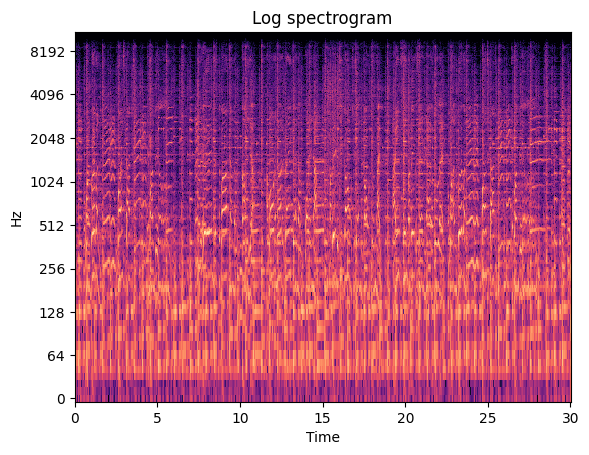

In [ ]:
D = ls.stft(y)
S_db = ls.amplitude_to_db(np.abs(D), ref=np.max)

img = ls.display.specshow(
    S_db, sr=sr, x_axis='time', y_axis='log',cmap='magma'
)

plt.colorbar(img, ax=ax, format='%+2.0f dB')
plt.title("Log spectrogram")
plt.show()

Visualize chromagram

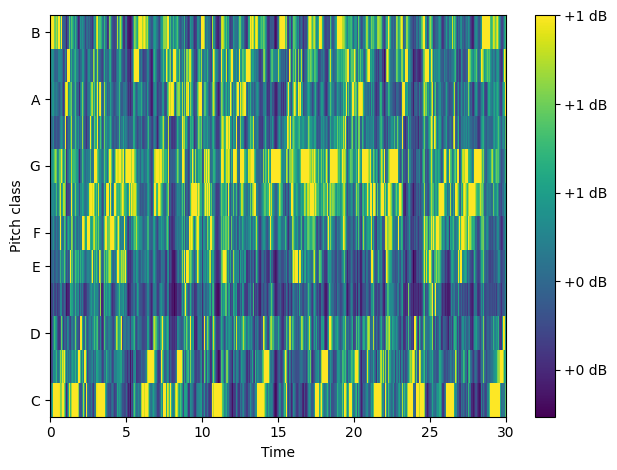

In [ ]:
C = ls.feature.chroma_cqt(y=y, sr=sr)

img = ls.display.specshow(
  C, x_axis='time', y_axis='chroma', cmap='viridis'
)

fig.suptitle("Chromagram (Harmony / Pitch Class)", fontsize=16, fontweight="bold")
plt.colorbar(img, format='%+2.0f dB')
plt.tight_layout()
plt.show()

## Data visualization

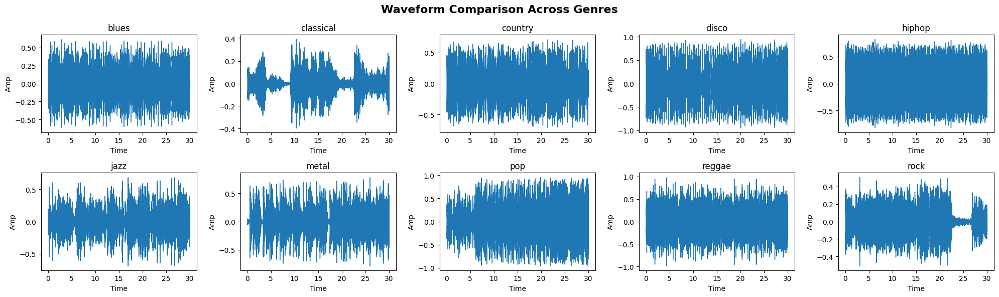

In [ ]:
genres = sorted([d for d in os.listdir(DATA_PATH)
                 if os.path.isdir(os.path.join(DATA_PATH, d))])[:10]

samples = sample_one_file_per_genre(DATA_PATH, genres)

plot_waveform_grid(samples)

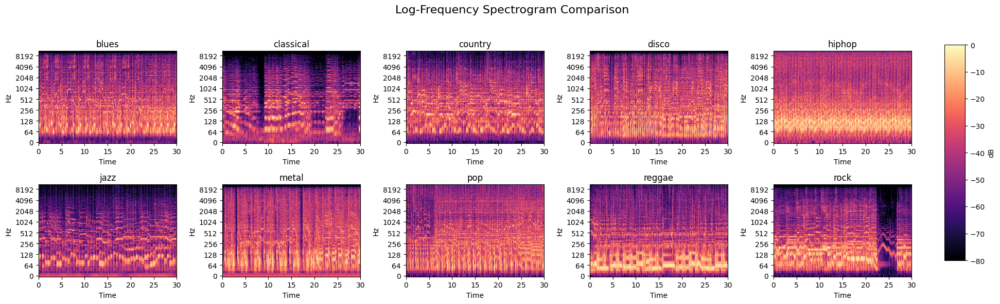

In [ ]:
plot_spectrogram_grid(samples)

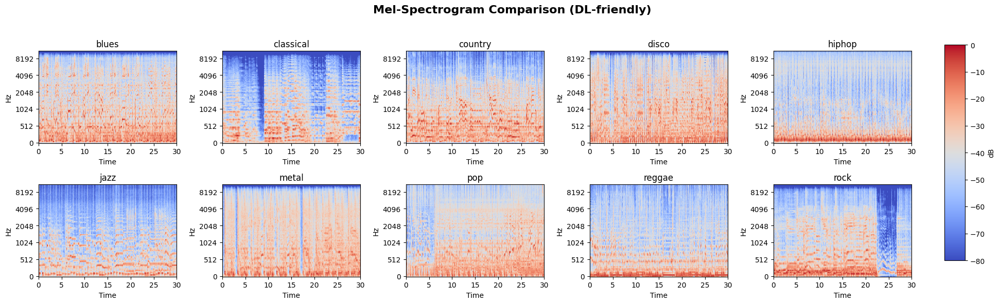

In [ ]:
plot_mel_grid(samples)

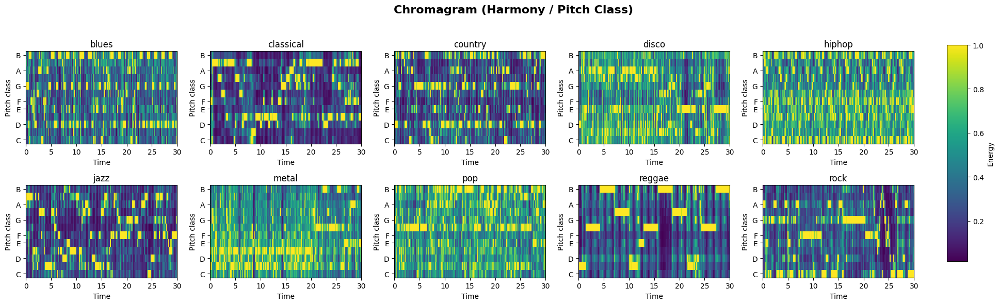

In [ ]:
plot_chroma_grid(samples)

Visualizing class: blues


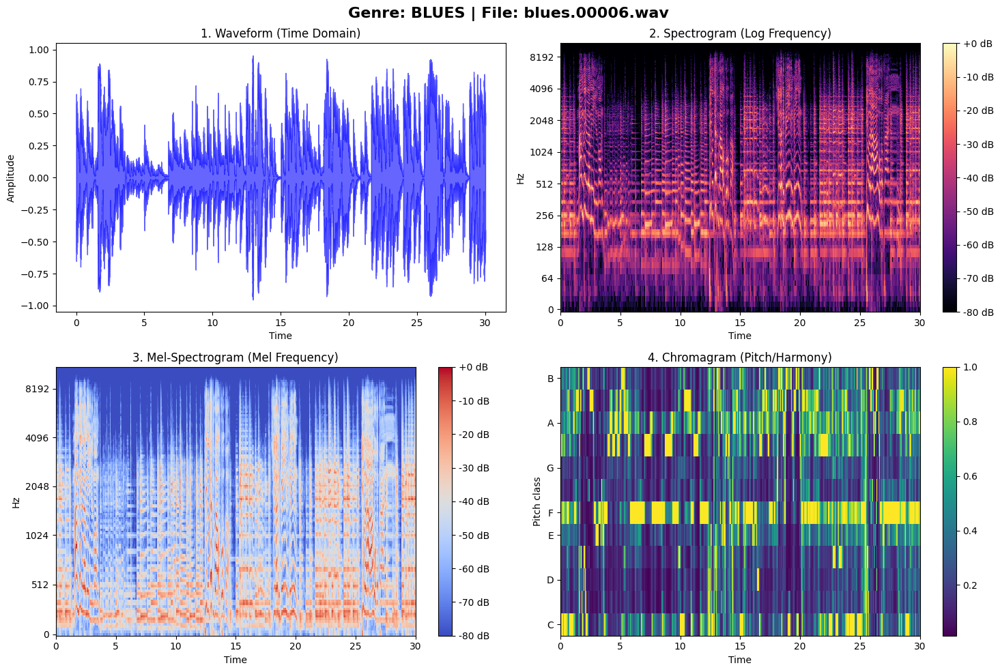

Visualizing class: country


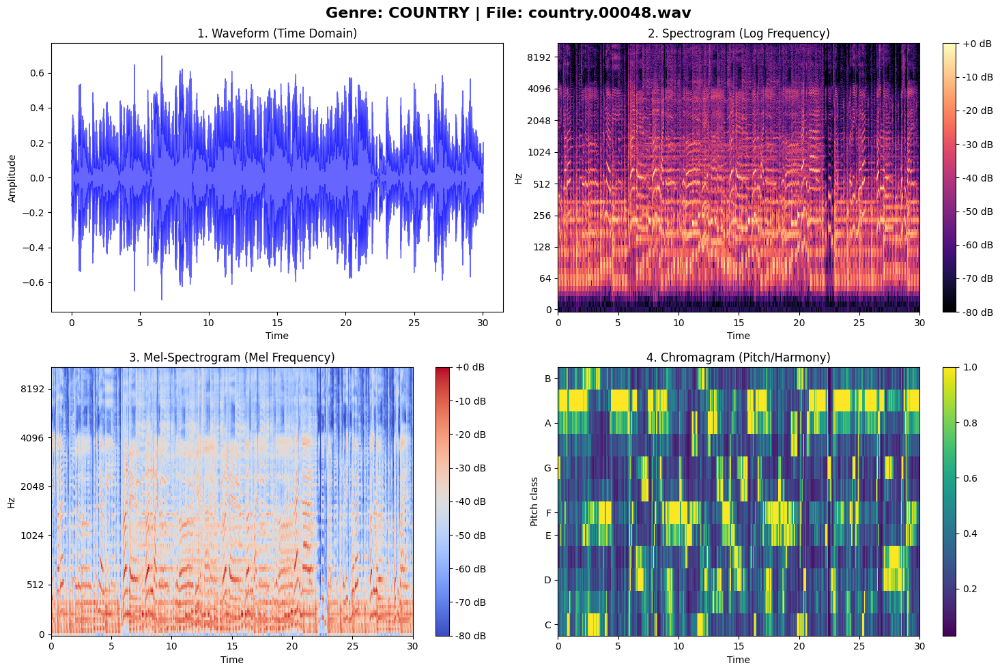

Visualizing class: disco


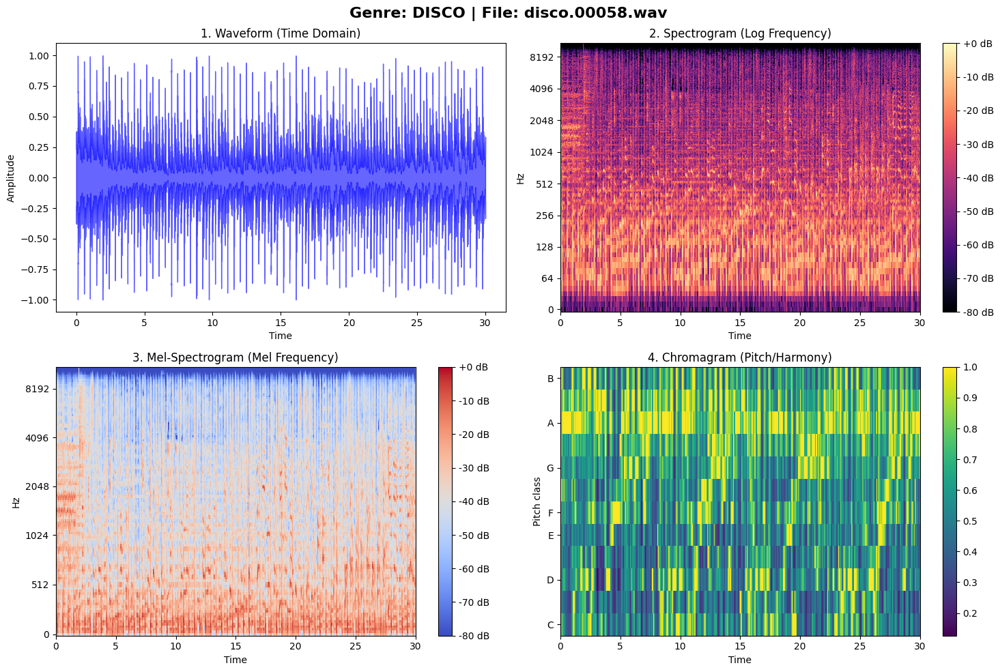

Visualizing class: classical


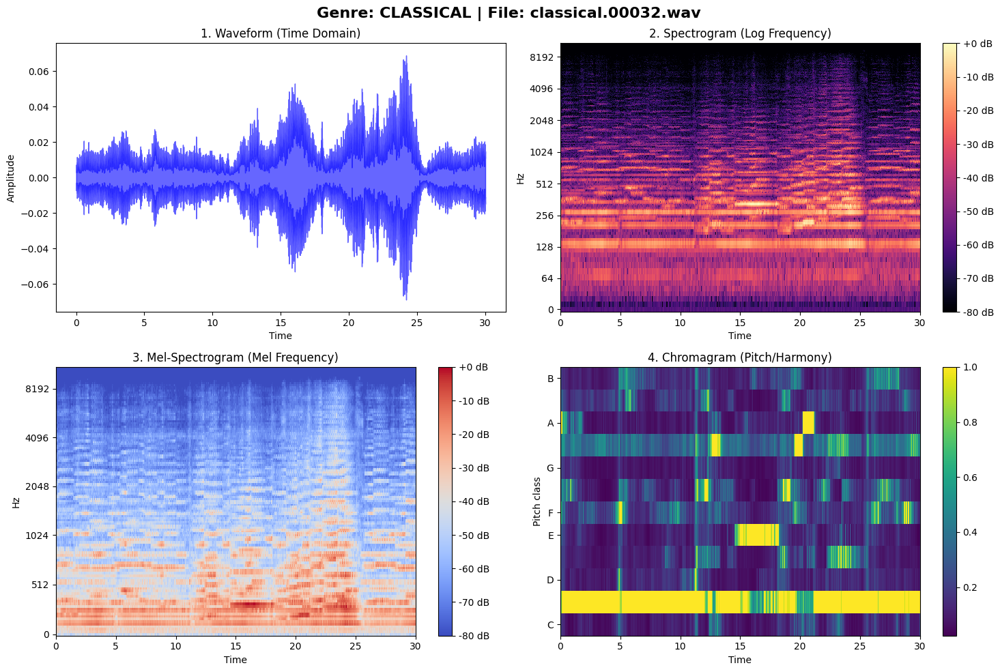

Visualizing class: rock


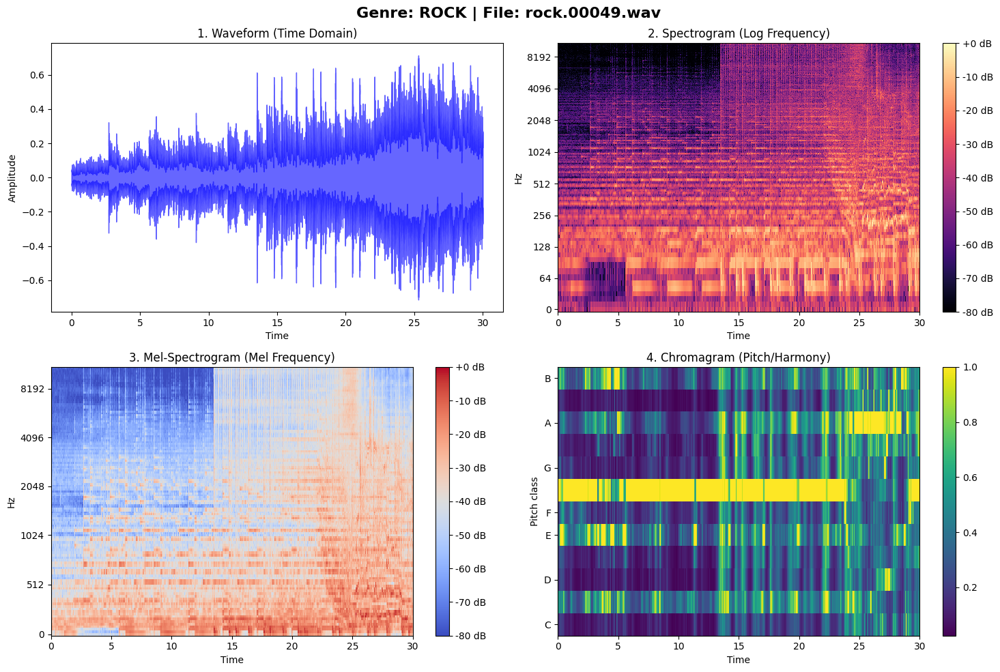

Visualizing class: hiphop


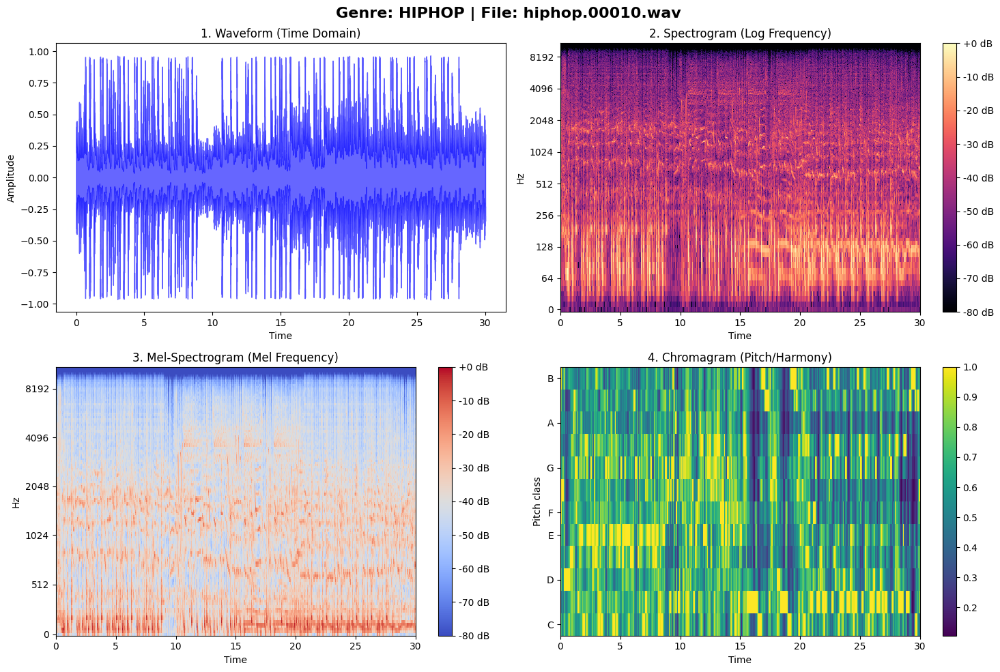

Visualizing class: pop


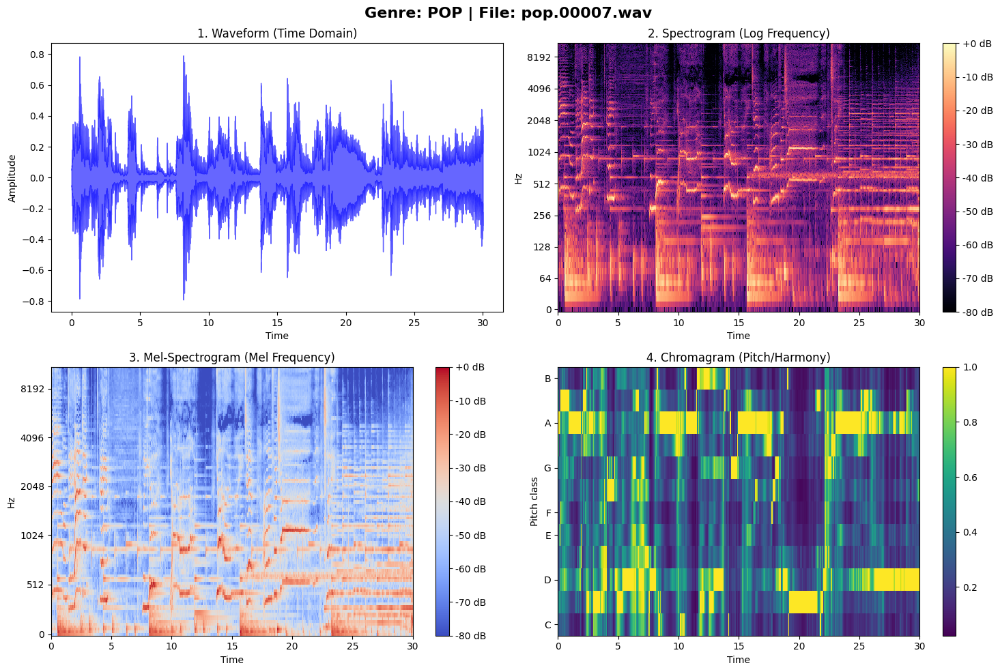

Visualizing class: reggae


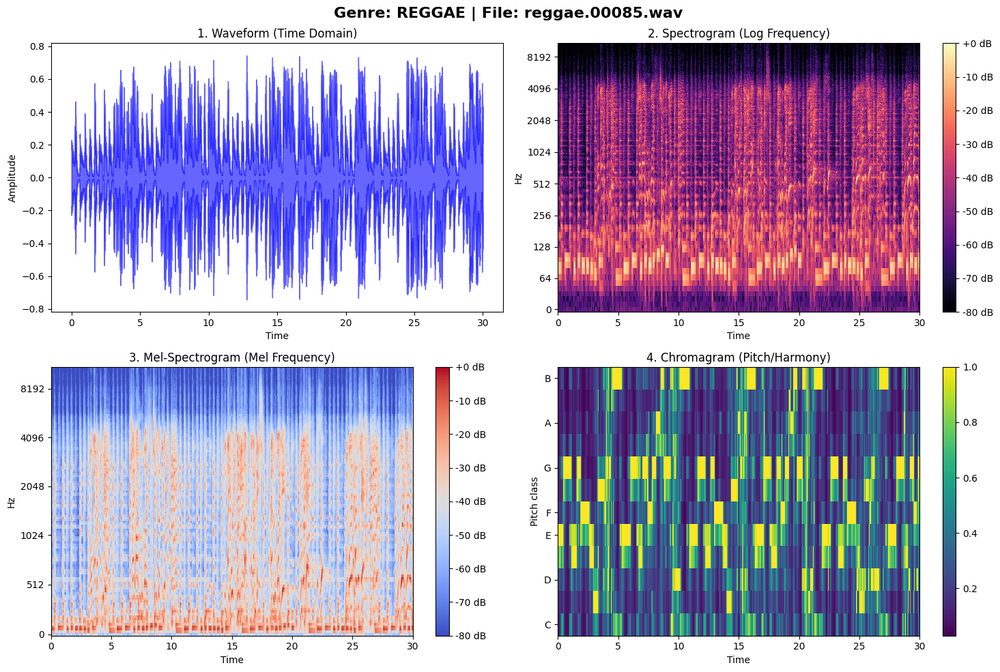

Visualizing class: jazz


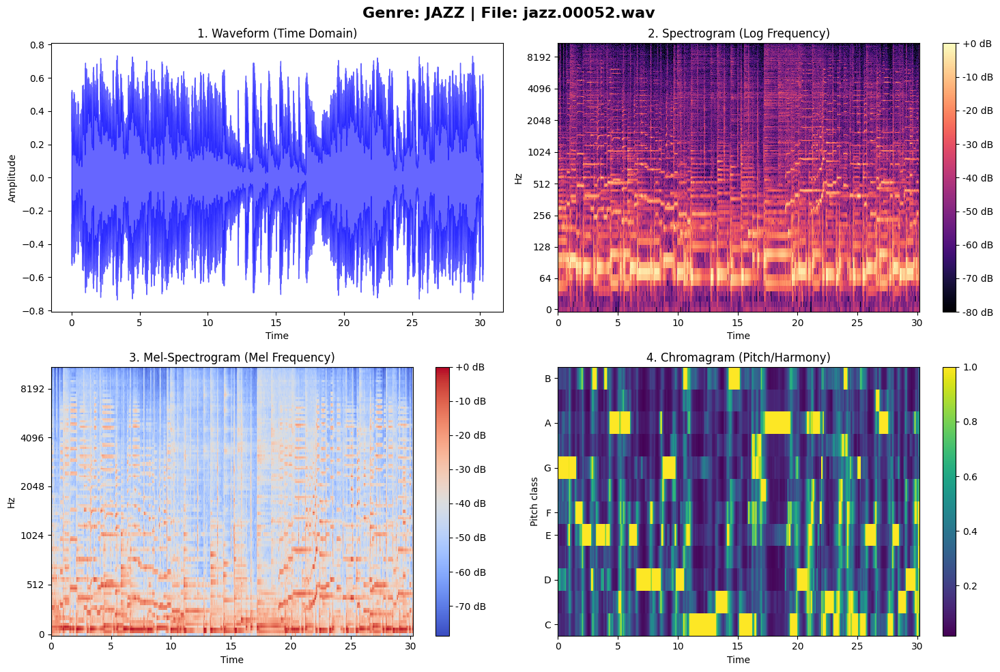

Visualizing class: metal


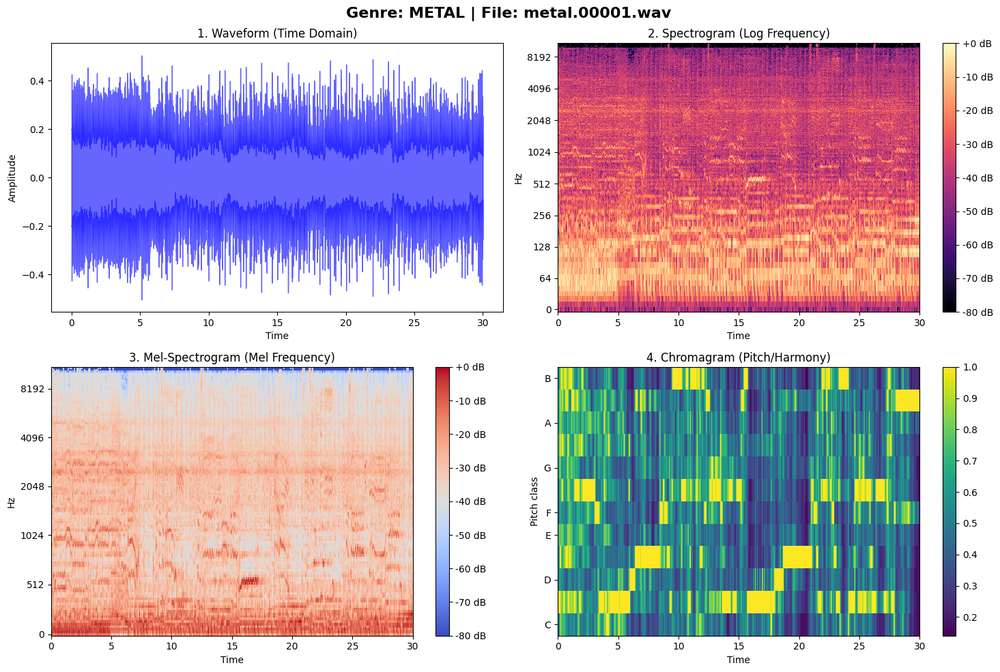

In [ ]:
genres = [d for d in os.listdir(DATA_PATH) if os.path.isdir(os.path.join(DATA_PATH, d))]

for genre in genres:
    genre_dir = os.path.join(DATA_PATH, genre)
    files = [f for f in os.listdir(genre_dir) if f.endswith(('.wav', '.mp3', '.au'))]

    if files:
        random_file = random.choice(files)
        file_path = os.path.join(genre_dir, random_file)

        print(f"Visualizing class: {genre}")
        visualize_genre_dashboard(file_path, genre)
    else:
        print(f"File not found for folder {genre}")

## EDA all file wav

Implement feature extract on 3s recording segments

In [ ]:
DATA_PATH = "Data/genres_original"
SEGMENT_DURATION = 3.0
target_sr = 22050

data = []

for genre in os.listdir(DATA_PATH):
    genre_dir = os.path.join(DATA_PATH, genre)
    if not os.path.isdir(genre_dir): continue

    for fname in os.listdir(genre_dir):
        path = os.path.join(genre_dir, fname)

        try:
            y_full, sr = ls.load(path, sr=target_sr)

            samples_per_segment = int(SEGMENT_DURATION * sr)
            total_samples = len(y_full)
            num_segments = int(total_samples / samples_per_segment)

            for s in range(num_segments):
                start = s * samples_per_segment
                end = start + samples_per_segment

                y_slice = y_full[start:end]

                features = extract_features(y_slice, sr)

                features["genre"] = genre
                features["file_name"] = fname
                features["segment_id"] = s

                data.append(features)

        except Exception as e:
            print(f"Error processing {fname}: {e}")

# df = pd.DataFrame(data)
# print(f"Shape of data: {df.shape}")

In [ ]:
# df.to_csv("Data/features_data.csv", index=False)

In [ ]:
# df = pd.DataFrame(data)
df = pd.read_csv("Data/features_data.csv")
df.head()

,duration,silence_ratio,tempo,zcr_mean,zcr_std,rms_mean,rms_std,harm_mean,harm_var,perc_mean,...,contrast4_std,contrast5_mean,contrast5_std,contrast6_mean,contrast6_std,contrast7_mean,contrast7_std,genre,file_name,segment_id
0,3.0,0.0,95.703125,0.103471,0.044205,0.186035,0.062554,8.184155e-07,0.017824,-0.000011,...,3.181523,18.902289,3.063468,17.791438,3.710450,40.595684,4.367119,blues,blues.00057.wav,0
1,3.0,0.0,92.285156,0.091947,0.037615,0.181086,0.053101,-2.865504e-05,0.014777,-0.000112,...,3.508249,18.707072,3.405413,15.636847,2.427802,40.228564,5.286467,blues,blues.00057.wav,1
2,3.0,0.0,92.285156,0.082125,0.036506,0.170957,0.062335,4.439687e-05,0.013494,0.000011,...,3.614520,18.341010,3.610069,16.210556,2.274001,39.046314,5.361742,blues,blues.00057.wav,2
3,3.0,0.0,184.570312,0.078854,0.029347,0.179893,0.058324,3.277215e-05,0.016430,0.000029,...,3.603079,18.838333,2.666838,17.423283,2.571283,38.830092,5.379122,blues,blues.00057.wav,3
4,3.0,0.0,92.285156,0.079312,0.030010,0.157313,0.052512,-6.133766e-05,0.009765,-0.000092,...,3.531433,17.652372,3.043437,16.469188,2.530384,39.096503,4.758862,blues,blues.00057.wav,4


Check basic information

In [ ]:
df.shape

(9991, 140)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9991 entries, 0 to 9990
Columns: 140 entries, duration to segment_id
dtypes: float64(137), int64(1), object(2)
memory usage: 10.7+ MB


In [ ]:
df.columns

Index(['duration', 'silence_ratio', 'tempo', 'zcr_mean', 'zcr_std', 'rms_mean',
       'rms_std', 'harm_mean', 'harm_var', 'perc_mean',
       ...
       'contrast4_std', 'contrast5_mean', 'contrast5_std', 'contrast6_mean',
       'contrast6_std', 'contrast7_mean', 'contrast7_std', 'genre',
       'file_name', 'segment_id'],
      dtype='object', length=140)

In [ ]:
df.describe()

,duration,silence_ratio,tempo,zcr_mean,zcr_std,rms_mean,rms_std,harm_mean,harm_var,perc_mean,...,contrast3_std,contrast4_mean,contrast4_std,contrast5_mean,contrast5_std,contrast6_mean,contrast6_std,contrast7_mean,contrast7_std,segment_id
count,9991.0,9991.000000,9991.000000,9991.000000,9991.000000,9991.000000,9991.000000,9991.000000,9.991000e+03,9991.000000,...,9991.000000,9991.000000,9991.000000,9991.000000,9991.000000,9991.000000,9991.000000,9991.000000,9991.000000,9991.000000
mean,3.0,0.000431,125.562366,0.102578,0.043659,0.130070,0.043827,-0.000365,1.260731e-02,-0.000396,...,4.421594,19.253370,3.718933,19.249415,3.248777,18.742579,2.895504,28.352088,3.757170,4.495946
std,0.0,0.013001,22.882249,0.045649,0.026724,0.068143,0.027414,0.001700,1.264586e-02,0.001110,...,0.745401,3.033137,0.795112,2.835877,0.822538,2.539072,0.951615,11.111628,2.046245,2.870540
min,3.0,0.000000,37.999770,0.013525,0.002252,0.000947,0.000201,-0.026748,9.312166e-23,-0.008820,...,1.661062,12.048141,0.703329,12.274066,0.490702,12.172546,0.615384,12.196016,0.519911,0.000000
25%,3.0,0.000000,107.666016,0.067298,0.025051,0.083295,0.025081,-0.000119,4.095346e-03,-0.000564,...,3.884516,17.137848,3.156918,17.230556,2.669721,16.887496,2.220948,16.460347,1.960956,2.000000
50%,3.0,0.000000,123.046875,0.097863,0.037290,0.120550,0.038745,-0.000013,8.434654e-03,-0.000051,...,4.340854,18.730834,3.644039,18.774848,3.164859,18.181944,2.743724,30.868064,3.842816,4.000000
75%,3.0,0.000000,135.999178,0.132745,0.055302,0.175341,0.055801,0.000015,1.733310e-02,0.000019,...,4.866453,20.868819,4.179936,20.698382,3.736759,20.055441,3.402208,39.421357,4.874512,7.000000
max,3.0,0.914860,215.332031,0.347705,0.255314,0.440458,0.179944,0.015719,1.270379e-01,0.006843,...,9.539288,34.954696,7.928682,38.701440,9.450969,32.045755,9.284027,47.530675,15.814232,9.000000


Feature visualization

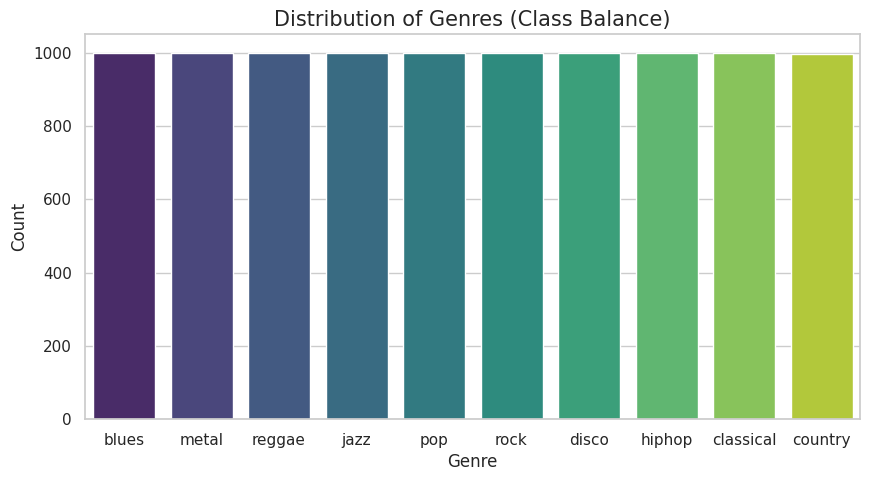

In [ ]:
%matplotlib inline
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)


# Check class balance
plt.figure(figsize=(10, 5))
sns.countplot(x='genre', data=df, palette='viridis',
              order = df['genre'].value_counts().index)
plt.title('Distribution of Genres (Class Balance)', fontsize=15)
plt.xlabel('Genre')
plt.ylabel('Count')
plt.show()

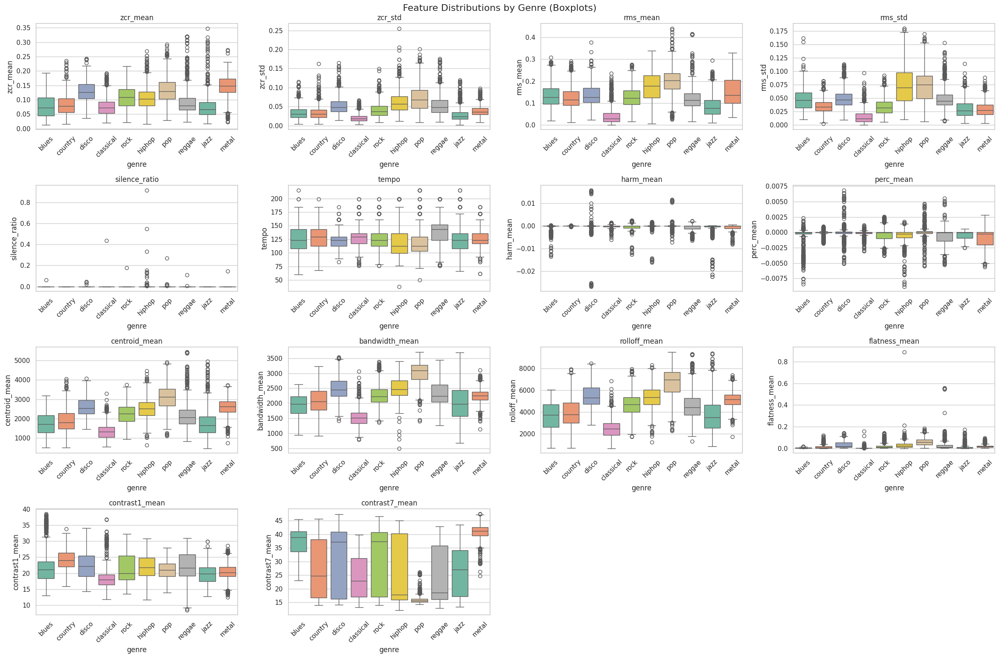

In [ ]:
# Boxplot
features_to_check = [
    'zcr_mean','zcr_std','rms_mean','rms_std',
    'silence_ratio','tempo',
    'harm_mean','perc_mean',
    'centroid_mean','bandwidth_mean','rolloff_mean',
    'flatness_mean','contrast1_mean','contrast7_mean'
]

n = len(features_to_check)
cols = 4
rows = (n + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(6*cols, 4*rows))
axes = axes.flatten()

fig.suptitle('Feature Distributions by Genre (Boxplots)', fontsize=16)

for i, col in enumerate(features_to_check):
    sns.boxplot(x='genre', y=col, data=df, ax=axes[i], palette='Set2')
    axes[i].set_title(col)
    axes[i].tick_params(axis='x', rotation=45)


for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()


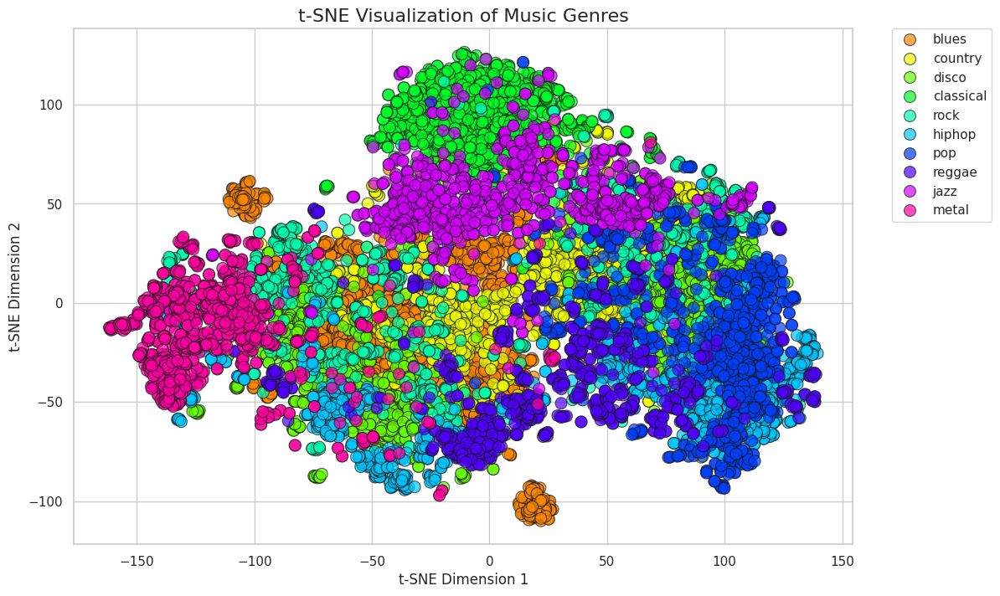

In [ ]:
# Tsne visualization
X = df.drop(['genre', 'silence_ratio', 'file_name', 'segment_id'], axis=1)
y = df['genre']
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

tsne = TSNE(n_components=2, perplexity=30, n_iter=3000, random_state=42,
            init='pca', learning_rate='auto')
X_tsne = tsne.fit_transform(X_scaled)

plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=X_tsne[:, 0], y=X_tsne[:, 1],
    hue=y,
    palette=sns.color_palette("hsv", len(y.unique())),
    s=100, alpha=0.7, edgecolor='k'
)
plt.title('t-SNE Visualization of Music Genres', fontsize=16)
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.) #
plt.show()

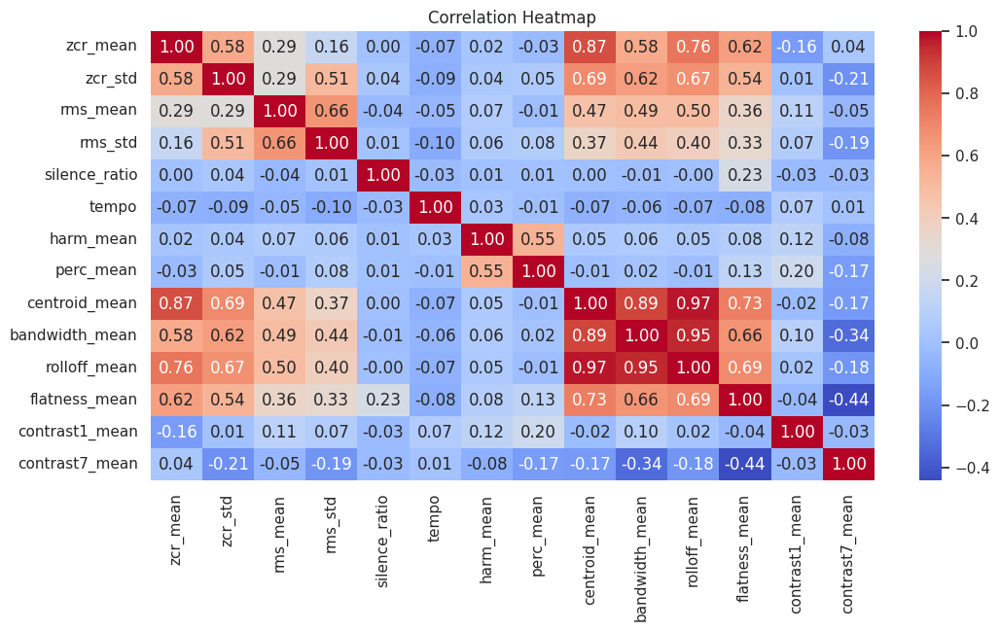

In [ ]:
df_temp = df.copy()
df_temp = df_temp[features_to_check]
sns.heatmap(df_temp.corr(), annot=True, fmt = '.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

**Correlation structure observation.**  
The heatmap shows strong positive correlations within the frequency-domain group (e.g., *centroid_mean, bandwidth_mean, rolloff_mean, flatness_mean*) and also notable correlations between these frequency features and some time-domain features such as *zcr_mean, zcr_std,* and *rms_mean*. This indicates that both groups capture overlapping information related to signal energy distribution and spectral activity, rather than being fully independent representations.

**About modeling.**  
Such high inter-feature correlations suggest **multicollinearity**, which can negatively affect linear and distance-based models (e.g., linear regression, SVM, k-NN). Therefore, it is reasonable to **drop or reduce redundant features**, for example by keeping one representative feature per highly correlated cluster, or by applying dimensionality reduction (e.g., PCA) to mitigate redundancy while preserving most of the information.


**NOTE** Here we do not use PCA

## Feature engineering

Preprocessing unneccesary columns, label encoding and divide into train/test split

In [ ]:
groups = df['file_name']
X = df.drop(['genre', 'duration', 'silence_ratio', 'file_name', 'segment_id'], axis=1)
y = df['genre']

le = LabelEncoder()
y_encoded = le.fit_transform(y)

# to avoid data leakage and balance the class for training and testing
sgkf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=42)
train_idx, test_idx = next(sgkf.split(X, y_encoded, groups))

X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]
groups_train = groups.iloc[train_idx]
groups_test = groups.iloc[test_idx]

Applying standard scaler

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## Training models without noise

### Training with feature-based

#### Tradition ML

In [ ]:
# Load from folder config/models.yaml
models_setup = load_models()

Tunning params based on grid CV across models to find out the best one (used in this case because small problem)

In [ ]:
comparison_results = compare_models(
    models_setup,
    X_train_scaled,
    y_train,
    groups=groups_train,
    # task_type='classification',
    cv=5,
    scoring='accuracy'
)

best_model_name = comparison_results.iloc[0]['Model']
best_params = comparison_results.iloc[0]['Best_Params']
print(f"Retraining best model: {best_model_name} with params: {best_params}")


SVC                 : 0.7649 (Time: 276.14s)
LogisticRegression  : 0.7150 (Time: 24.23s)
GaussianNB          : 0.5743 (Time: 0.35s)
KNeighbors          : 0.7061 (Time: 92.78s)
RandomForest        : 0.7289 (Time: 931.36s)
DecisionTree        : 0.5297 (Time: 102.85s)
AdaBoost            : 0.4202 (Time: 292.24s)
XGBoost             : 0.7727 (Time: 3819.67s)
LightGBM            : 0.7191 (Time: 253.71s)
Retraining best model: XGBoost with params: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}


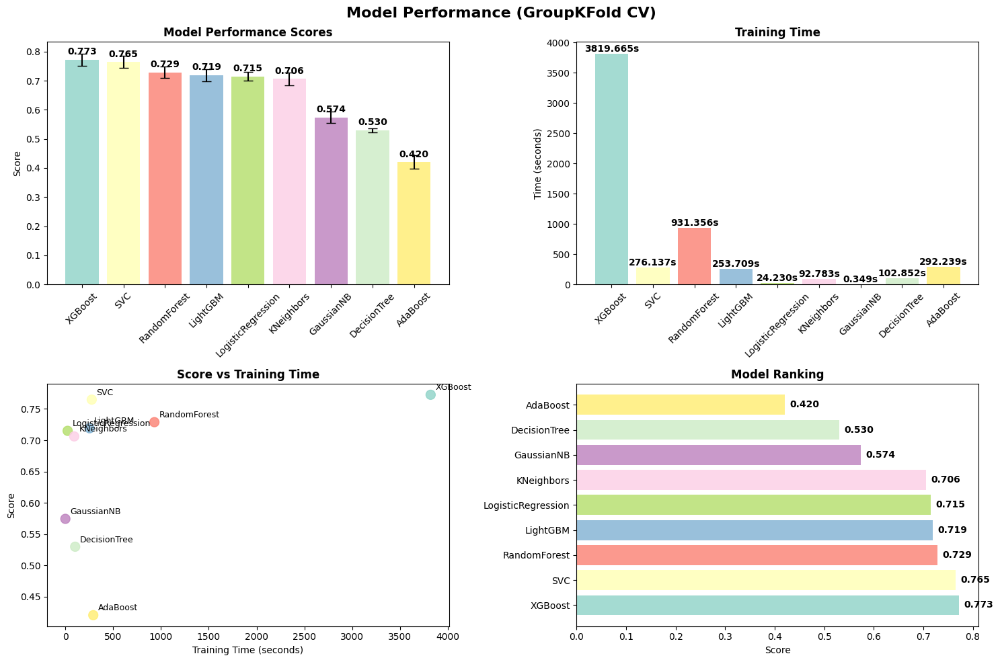

In [ ]:
%matplotlib inline
plot_model_comparison(
    comparison_results,
    title="Model Performance (GroupKFold CV)",
    figsize=(15, 10)
)

Training the best found model

In [ ]:
best_model = SVC(kernel='rbf')
best_model.fit(X_train_scaled, y_train)

# using voting across predictions among 3s segments
evaluate_song_level_accuracy(best_model, X_test_scaled, y_test, groups_test, le)

Segment-level Accuracy: 0.7392
Song-level Accuracy (Voting): 0.7950


0.795

#### Deeplearning (MLP)

In [ ]:
file_names = df['file_name'].unique()

file_labels = df.drop_duplicates('file_name')['genre']

le = LabelEncoder()
file_labels_enc = le.fit_transform(file_labels)

train_files, temp_files, _, temp_labels = train_test_split(
    file_names,
    file_labels_enc,
    test_size=0.30,
    stratify=file_labels_enc,
    random_state=42
)


In [ ]:
val_files, test_files = train_test_split(
    temp_files,
    test_size=0.50,
    stratify=temp_labels,
    random_state=42
)

# ---- extract rows back to df ----
train_idx = df['file_name'].isin(train_files)
val_idx   = df['file_name'].isin(val_files)
test_idx  = df['file_name'].isin(test_files)

X_train, y_train = X[train_idx], y_encoded[train_idx]
X_val,   y_val   = X[val_idx],   y_encoded[val_idx]
X_test,  y_test  = X[test_idx],  y_encoded[test_idx]

In [ ]:
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

In [ ]:
X_train_scaled = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.long)
X_val_scaled = torch.tensor(X_val_scaled, dtype=torch.float32)
y_val = torch.tensor(y_val, dtype=torch.long)
X_test_scaled = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test = torch.tensor(y_test, dtype=torch.long)

In [ ]:
X_train_scaled.shape, y_train.shape, X_val_scaled.shape, y_val.shape, X_test_scaled.shape, y_test.shape

(torch.Size([6994, 135]),
 torch.Size([6994]),
 torch.Size([1499, 135]),
 torch.Size([1499]),
 torch.Size([1498, 135]),
 torch.Size([1498]))

In [ ]:
model, ckpt = train_feature(
    X_train_scaled, y_train,
    X_val_scaled, y_val,
    input_dim=135,
    num_classes=10,
)

[1/100] Train Loss: 2.3180 | Val Loss: 2.2642 | Val Acc: 0.1841
[2/100] Train Loss: 2.2612 | Val Loss: 2.2139 | Val Acc: 0.3049
[3/100] Train Loss: 2.2064 | Val Loss: 2.1636 | Val Acc: 0.3602
[4/100] Train Loss: 2.1513 | Val Loss: 2.1113 | Val Acc: 0.3662
[5/100] Train Loss: 2.0915 | Val Loss: 2.0568 | Val Acc: 0.3736
[6/100] Train Loss: 2.0328 | Val Loss: 1.9999 | Val Acc: 0.3783
[7/100] Train Loss: 1.9681 | Val Loss: 1.9420 | Val Acc: 0.3823
[8/100] Train Loss: 1.9043 | Val Loss: 1.8849 | Val Acc: 0.3869
[9/100] Train Loss: 1.8399 | Val Loss: 1.8300 | Val Acc: 0.3916
[10/100] Train Loss: 1.7767 | Val Loss: 1.7789 | Val Acc: 0.3963
[11/100] Train Loss: 1.7239 | Val Loss: 1.7318 | Val Acc: 0.3983
[12/100] Train Loss: 1.6702 | Val Loss: 1.6878 | Val Acc: 0.4069
[13/100] Train Loss: 1.6222 | Val Loss: 1.6459 | Val Acc: 0.4189
[14/100] Train Loss: 1.5746 | Val Loss: 1.6053 | Val Acc: 0.4356
[15/100] Train Loss: 1.5315 | Val Loss: 1.5663 | Val Acc: 0.4583
[16/100] Train Loss: 1.4884 | Val 

In [ ]:
test_feature(model, X_test_scaled, y_test)


>>> Test Accuracy: 0.7350

Classification Report:
              precision    recall  f1-score   support

           0     0.7296    0.7733    0.7508       150
           1     0.8625    0.9262    0.8932       149
           2     0.7305    0.6867    0.7079       150
           3     0.5617    0.6107    0.5852       149
           4     0.6790    0.7333    0.7051       150
           5     0.8041    0.7933    0.7987       150
           6     0.8649    0.8533    0.8591       150
           7     0.8672    0.7400    0.7986       150
           8     0.7606    0.7200    0.7397       150
           9     0.5203    0.5133    0.5168       150

    accuracy                         0.7350      1498
   macro avg     0.7380    0.7350    0.7355      1498
weighted avg     0.7381    0.7350    0.7355      1498



0.7349799871444702

### Training with image-based

In [ ]:
#processing_image(DATA_PATH)

In [ ]:
# path_img = '/content/drive/MyDrive/ML_Project/Data/images_data/mel_spectrogram'
train_image("Data/images_data/mel_spectrogram", num_classes=10)

In [ ]:
train_image("Data/images_data/waveform", num_classes=10)

In [ ]:
train_image("Data/images_original/", num_classes=10)

### gpt

In [ ]:
# === ONE CELL END-TO-END: Load wav → MelSpec → Pad → Train CNN → Report ===
import os, glob, librosa as ls, numpy as np, torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

DATA_PATH = "Data/genres_original"
SAMPLE_RATE = 22050
N_MELS = 128

# --------- DATASET ---------
class MelDataset(Dataset):
    def __init__(self, files, labels):
        self.files = files
        self.labels = labels

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        path = self.files[idx]
        y, sr = ls.load(path, sr=SAMPLE_RATE)
        mel = ls.feature.melspectrogram(y=y, sr=sr, n_mels=N_MELS)
        mel = ls.power_to_db(mel).astype(np.float32)
        return torch.tensor(mel).unsqueeze(0), self.labels[idx]  # (1,128,T), int

# --------- COLLATE_FN: PAD TO MAX T IN BATCH ----------
def pad_collate(batch):
    xs, ys = zip(*batch)
    max_T = max(x.shape[-1] for x in xs)
    padded = []
    for x in xs:
        T = x.shape[-1]
        if T < max_T:
            pad = torch.zeros((1, N_MELS, max_T-T))
            x = torch.cat([x, pad], dim=-1)
        padded.append(x)
    return torch.stack(padded), torch.tensor(ys).long()

# --------- SCAN DATA ---------
files, labels = [], []
for g in os.listdir(DATA_PATH):
    for f in glob.glob(f"{DATA_PATH}/{g}/*.wav"):
        files.append(f)
        labels.append(g)

le = LabelEncoder()
y = le.fit_transform(labels)

train_files, test_files, train_labels, test_labels = train_test_split(
    files, y, test_size=0.2, stratify=y, random_state=42
)

train_ds = MelDataset(train_files, train_labels)
test_ds  = MelDataset(test_files, test_labels)

train_loader = DataLoader(train_ds, batch_size=8, shuffle=True, collate_fn=pad_collate)
test_loader  = DataLoader(test_ds, batch_size=8, collate_fn=pad_collate)

# --------- CNN (adaptive global pool) ---------
class BasicCNN(nn.Module):
    def __init__(self, n_classes):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(1, 16, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(16, 32, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
        )
        self.gap = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(64, n_classes)

    def forward(self, x):
        x = self.features(x)
        x = self.gap(x).view(x.size(0), -1)
        return self.fc(x)

device = "cuda" if torch.cuda.is_available() else "cpu"
model = BasicCNN(len(le.classes_)).to(device)
opt = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.CrossEntropyLoss()



In [ ]:
# --------- TRAIN ---------
for epoch in range(50):
    model.train()
    total_loss, correct, total = 0, 0, 0
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        opt.zero_grad()
        out = model(xb)
        loss = loss_fn(out, yb)
        loss.backward()
        opt.step()

        total_loss += loss.item()
        preds = out.argmax(1)
        correct += (preds == yb).sum().item()
        total += yb.size(0)

    print(f"Epoch {epoch+1:02d} | loss={total_loss/len(train_loader):.4f} | acc={100*correct/total:.2f}%")

# --------- TEST + REPORT ---------
model.eval()
preds, trues = [], []
with torch.no_grad():
    for xb, yb in test_loader:
        out = model(xb.to(device))
        preds.extend(out.argmax(1).cpu().numpy())
        trues.extend(yb.numpy())

print(classification_report(trues, preds, target_names=le.classes_))

Epoch 01 | loss=2.1033 | acc=21.62%
Epoch 02 | loss=1.8559 | acc=32.62%
Epoch 03 | loss=1.7030 | acc=38.12%
Epoch 04 | loss=1.6028 | acc=41.62%
Epoch 05 | loss=1.4517 | acc=46.62%
Epoch 06 | loss=1.4349 | acc=47.00%
Epoch 07 | loss=1.3427 | acc=52.25%
Epoch 08 | loss=1.2948 | acc=52.62%
Epoch 09 | loss=1.2334 | acc=56.00%
Epoch 10 | loss=1.2250 | acc=54.62%
Epoch 11 | loss=1.1819 | acc=58.25%
Epoch 12 | loss=1.1528 | acc=59.50%
Epoch 13 | loss=1.1158 | acc=60.50%
Epoch 14 | loss=1.0779 | acc=61.00%
Epoch 15 | loss=1.0509 | acc=64.25%
Epoch 16 | loss=1.0106 | acc=66.38%
Epoch 17 | loss=0.9584 | acc=66.75%
Epoch 18 | loss=0.9705 | acc=66.75%
Epoch 19 | loss=0.9319 | acc=68.00%
Epoch 20 | loss=0.9286 | acc=66.62%
Epoch 21 | loss=0.9081 | acc=68.50%
Epoch 22 | loss=0.9241 | acc=67.12%
Epoch 23 | loss=0.8661 | acc=70.12%
Epoch 24 | loss=0.8382 | acc=71.50%
Epoch 25 | loss=0.8235 | acc=71.62%
Epoch 26 | loss=0.8121 | acc=72.25%
Epoch 27 | loss=0.7993 | acc=71.75%
Epoch 28 | loss=0.7536 | acc

## Training models with noise